In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import os 
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import requests
import shutil
from shapely.geometry import Point
from scipy.spatial import KDTree

In [2]:
directorio = os.path.dirname(os.getcwd())

In [3]:
baches = gpd.read_file(directorio + '/data/processed/tidy_baches_agebs_hmo.shp')
baches.CVEGEO = baches.CVEGEO.str[-4:]
se_ageb = gpd.read_file(directorio + '/data/processed/tidy_socioeconimico_ageb_hermosillo.shp')
se = pd.read_csv(directorio + '/data/processed/tidy_socioeconomico_hermosillo.csv')

In [4]:
baches = baches.dropna()

In [5]:
# Convertir a un sistema de referencia proyectado (metros) para medir distancias
gdf = baches.to_crs("EPSG:3857")

# Extraer las coordenadas de los puntos en metros
coordinates = [(geom.x, geom.y) for geom in gdf.geometry]

# Crear un KDTree con las coordenadas para encontrar vecinos cercanos
tree = KDTree(coordinates)
processed_indices = set()
new_data = []

# Recorrer cada punto en el GeoDataFrame
for i, point in enumerate(coordinates):
    if i in processed_indices:
        continue
    
    # Encontrar puntos dentro de un radio de 2 metros
    indices = tree.query_ball_point(point, r=2)
    processed_indices.update(indices)
    
    # Filtrar el GeoDataFrame original para estos índices
    close_points = gdf.iloc[indices]
    
    # Obtener el punto medio de las coordenadas
    mean_x = close_points.geometry.x.mean()
    mean_y = close_points.geometry.y.mean()
    mean_point = Point(mean_x, mean_y)
    
    # Obtener la fecha más antigua y un ageb al azar
    oldest_date = close_points['date'].min()
    random_ageb = close_points['CVEGEO'].sample(1).iloc[0]  # Elegir un `ageb` al azar si hay varios
    
    # Guardar el resultado en una lista
    new_data.append({
        "date": oldest_date,
        "CVEGEO": random_ageb,
        "geometry": mean_point
    })

# Crear un nuevo GeoDataFrame con los resultados
new_gdf = gpd.GeoDataFrame(new_data, geometry="geometry", crs="EPSG:3857")

# Opcional: Convertir de nuevo a EPSG:4326 si necesitas las coordenadas originales
new_gdf = new_gdf.to_crs("EPSG:4326")


In [6]:
baches = new_gdf

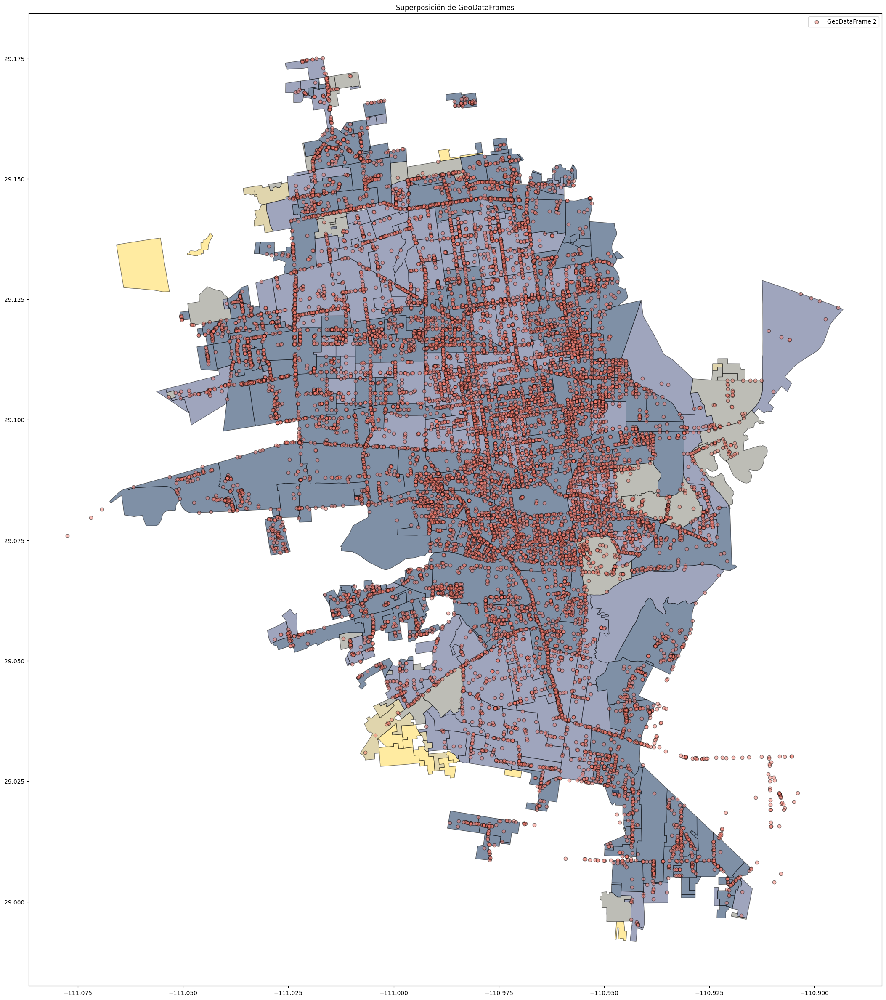

In [7]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb[se_ageb.GM_2020 == 'Muy alto'].plot(ax=ax, color="#FFD945", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Alto'].plot(ax=ax, color="#C2AC5C", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Medio'].plot(ax=ax, color="#7D7D6E", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Bajo'].plot(ax=ax, color="#414C7D", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Muy bajo'].plot(ax=ax, color="#00224E", edgecolor="black", alpha=0.5)

baches.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

In [8]:
#Descargando el archivo zip de las agebs
url = 'https://www.inegi.org.mx/contenidos/productos/prod_serv/contenidos/espanol/bvinegi/productos/geografia/urbana/SHP_2/Sonora/702825317744_s.zip'

if not os.path.exists(directorio + '/data/raw/agebs_hmo.zip'):
    if not os.path.exists(directorio + '/data/raw'):
        if not os.path.exists(directorio + '/data'):
            os.makedirs(directorio + '/data')
        os.makedirs(directorio + '/data/raw')
    r = requests.get(url, allow_redirects=True) 
    open(directorio + '/data/raw/agebs_hmo.zip', 'wb').write(r.content)

In [9]:
# Descomprimir agebs_hmo.zip y eliminar archivos inecesarios
datos = '/data/raw/agebs_hmo'
archivo_ageb = '/data/raw/agebs_hmo.zip'
hmo_ageb = ['.html', 'v.dbf','v.prj','v.shp', 'v.shp.xml', 'v.dbf', 'v.shx']

if not os.path.exists(directorio + datos):
    with zipfile.ZipFile(directorio + archivo_ageb, 'r') as zip_ref:
        zip_ref.extractall(path= directorio + datos)

with zipfile.ZipFile(directorio + datos + '/260300001.zip') as zip_ref:
    for archivo in hmo_ageb:
        if not os.path.exists(directorio + datos + '260300001' + archivo):
            zip_ref.extract('260300001' + archivo, directorio + '/data/raw')


shutil.rmtree(directorio + datos)
os.remove(directorio +'/data/raw/agebs_hmo.zip')

In [10]:
hmo_via =  gpd.read_file(directorio + '/data/raw/260300001v.shp')
hmo_via= hmo_via.to_crs("EPSG:4326")

<Axes: >

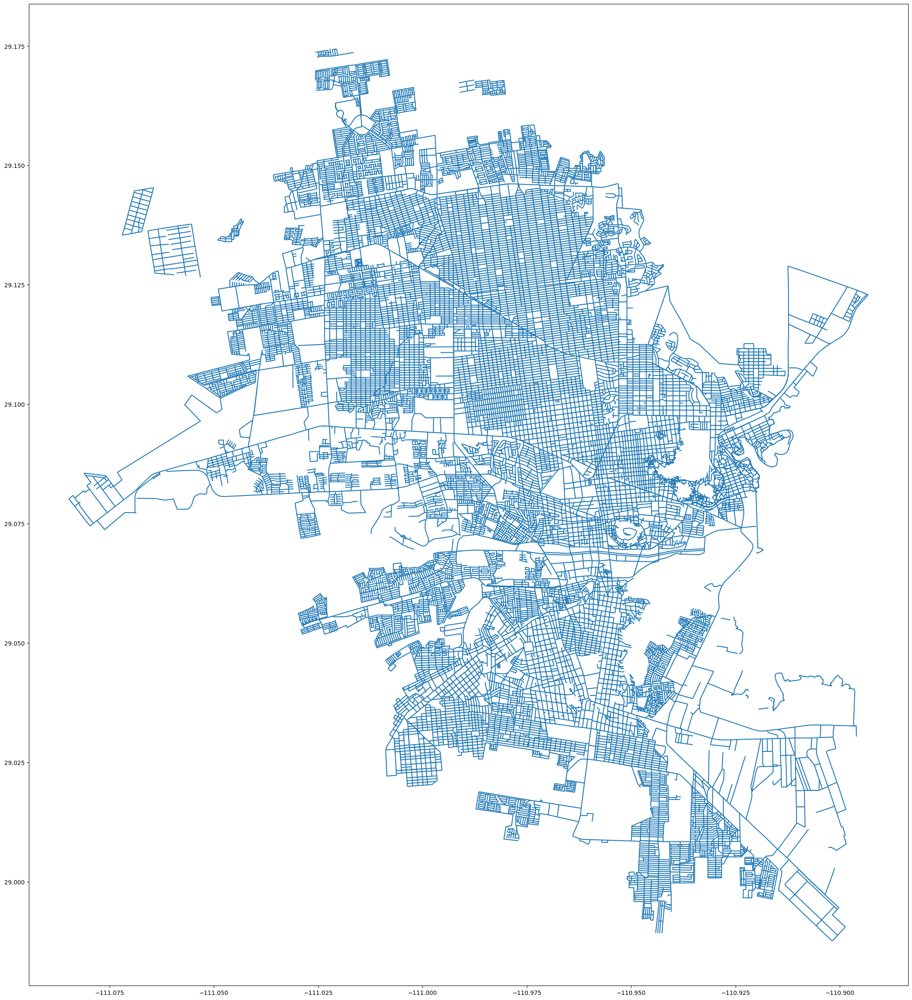

In [11]:
hmo_via.plot(figsize=(30,30))

/tmp/ipykernel_4025/896508431.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


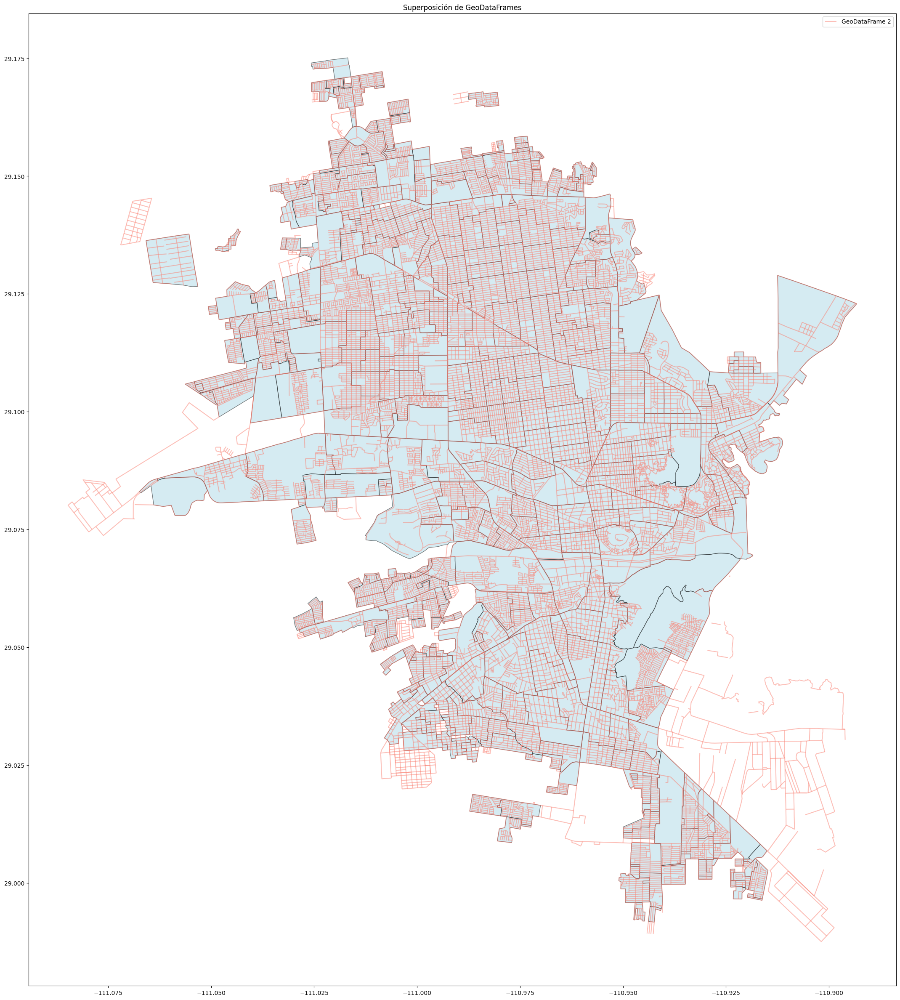

In [12]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

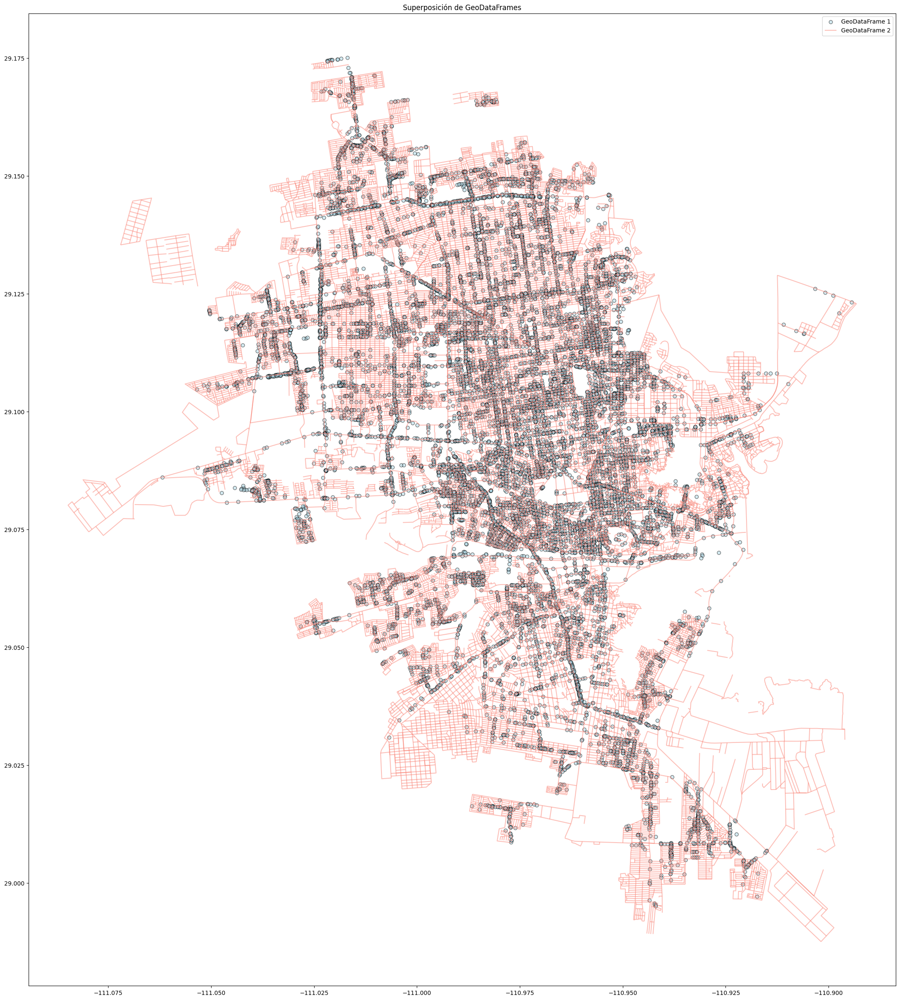

In [13]:
fig, ax = plt.subplots(figsize=(30,30))
baches[baches['CVEGEO'].isin(se_ageb.CVEGEO.to_list())].plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

In [14]:
hmo_via = hmo_via.to_crs('EPSG:32612')
baches = baches.to_crs('EPSG:32612')
vialidades_buffer = hmo_via.copy()
vialidades_buffer = vialidades_buffer.to_crs("EPSG:32612")


vialidades_buffer["geometry"] = hmo_via.buffer(8)  


puntos_en_vialidades = gpd.sjoin(baches, vialidades_buffer, predicate="within")

In [15]:
puntos = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
puntos.head(15)

,NOMVIAL,geometry,size
15341,SOLIDARIDAD,POINT (502673.643 3215867.627),3
5931,GENERAL BERNARDO REYES,POINT (503140.274 3223351.201),3
4924,EMILIANO ZAPATA,POINT (503383.25 3210625.522),3
16505,XOLOTL,POINT (505682.238 3210538.42),3
11664,PASEO DE LOS ÁNGELES,POINT (500529.481 3214373.161),3
16507,XOLOTL,POINT (504875.471 3210675.24),3
5906,GENERAL BERNARDO REYES,POINT (503398.072 3221539.46),3
369,2,POINT (504237.392 3220707.095),3
368,2,POINT (504230.256 3220703.677),3
16360,VILLA RESIDENCIAL BONITA,POINT (499222.676 3214833.393),3


In [16]:
baches_por_calle = puntos.groupby('NOMVIAL',as_index=False)['size'].sum().sort_values(by='size', ascending=False)

<Axes: >

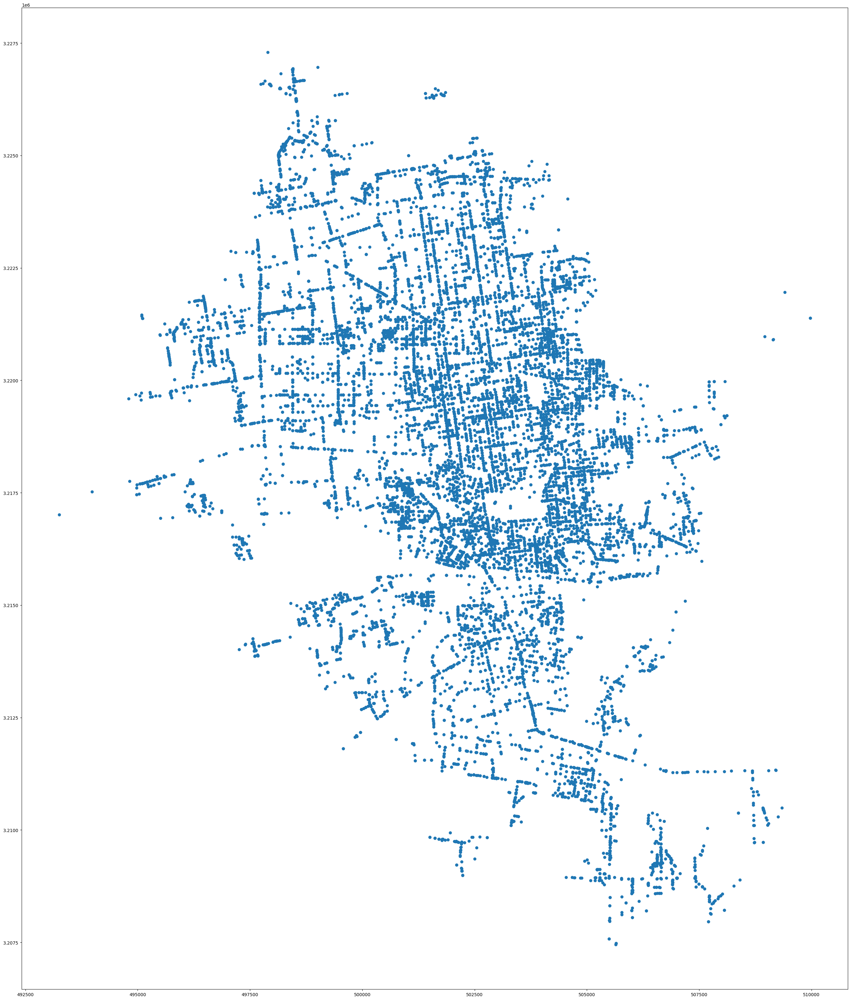

In [17]:
puntos_en_vialidades.plot(figsize=(40,40))

In [18]:
calles_baches = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
calles_baches = calles_baches.groupby('NOMVIAL', as_index=False)['size'].sum()

In [19]:
calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \
                                                    ['NOMVIAL'].head(20).to_list()

/tmp/ipykernel_4025/1262059468.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \


In [26]:
import geopandas as gpd
import folium
from folium.features import GeoJson, GeoJsonTooltip


latitud_centro = 29.072967
longitud_centro = -110.955919

# Filtrar las 20 calles con más baches
top_20_baches =  hmo_via[hmo_via['NOMVIAL'].isin(calles_baches)]

# Crear el mapa centrado en Hermosillo
m = folium.Map(location=[latitud_centro, longitud_centro], zoom_start=12)

# Añadir las vialidades generales al mapa
folium.GeoJson(
    hmo_via,
    name="Vialidades",
    style_function=lambda x: {'color': 'grey', 'weight': 1},
).add_to(m)

# Añadir las calles con más baches y resaltar
highlight = GeoJson(
    top_20_baches,
    name="Calles con más baches",
    style_function=lambda x: {'color': 'red', 'weight': 3},
    tooltip=GeoJsonTooltip(fields=['NOMVIAL'], aliases=['Calle:'])
)
highlight.add_to(m)

# Añadir controles de capa y mostrar el mapa
folium.LayerControl().add_to(m)

m.save(os.path.dirname(os.getcwd()) + "/images/mapa_baches.html")


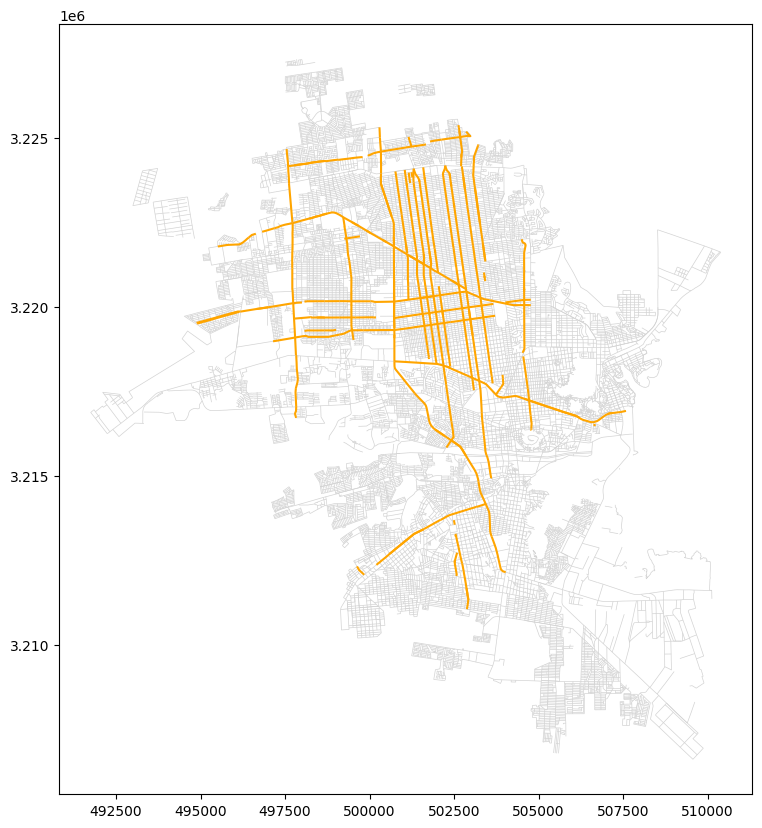

In [21]:
hmo_via['es_destacada'] = hmo_via['NOMVIAL'].isin(calles_baches)

# Graficar
fig, ax = plt.subplots(figsize=(10, 10))
hmo_via[~hmo_via['es_destacada']].plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)  # Colonias no destacadas
hmo_via[hmo_via['es_destacada']].plot(ax=ax, color='orange', edgecolor='red', linewidth=1.5)        # Colonias destacadas

plt.show()
hmo_via = hmo_via.drop(columns=['es_destacada'])

In [22]:
hmo_via['longitud'] = hmo_via.geometry.length
hey = hmo_via.groupby('NOMVIAL',as_index=False)['longitud'].sum().sort_values(by='longitud',ascending=False)
hey = hey[hey.NOMVIAL != 'NINGUNO']
hey = hey.reset_index(drop=True)
hey.head()

,NOMVIAL,longitud
0,SOLIDARIDAD,18217.934562
1,LÁZARO CÁRDENAS DEL RÍO,14696.308063
2,LUIS DONALDO COLOSIO MURRIETA,12142.825354
3,DE LA REFORMA,10467.482232
4,CAMINO DEL SERI,10140.943976


In [23]:
baches_por_calle = baches_por_calle.merge(hey, on='NOMVIAL')
baches_por_calle.head()

,NOMVIAL,size,longitud
0,DE LA REFORMA,266,10467.482232
1,SOLIDARIDAD,261,18217.934562
2,DOCTOR DOMINGO OLIVARES,230,8977.171615
3,LÁZARO CÁRDENAS DEL RÍO,187,14696.308063
4,LÓPEZ DEL CASTILLO,171,6335.441006


In [24]:
baches_por_calle['baches_por_metro'] = baches_por_calle['size'] / baches_por_calle['longitud']
baches_por_calle.head()
baches_por_calle.sort_values(by='baches_por_metro').head(10)

,NOMVIAL,size,longitud,baches_por_metro
1742,MOLINO DE CAMOU,1,2438.221771,0.000410
1949,JUAN ROMERO,1,2114.339798,0.000473
1662,CHETUMAL,1,2056.458278,0.000486
1703,NUDO MIXTECO,1,1932.925793,0.000517
1612,CUARTA,1,1719.328943,0.000582
1730,QUIRIEGO,1,1650.220592,0.000606
2030,DEL ORO,1,1586.266258,0.000630
1928,LEANDRO VALENCIA URÍAS,1,1573.148101,0.000636
2094,GLADIOLA,1,1517.222881,0.000659
2117,VERGEL,1,1438.253677,0.000695
